In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/marmara-region-earthquakes-apr-2324-2025/deprem_son24saat_duzenli.csv


In [2]:
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium.plugins import HeatMap
import geopandas as gpd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, KMeans
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from prophet import Prophet
import statsmodels.api as sm
from scipy.stats import pearsonr, spearmanr
from scipy.spatial.distance import cdist
import warnings
warnings.filterwarnings('ignore')
import os
import json
import time
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder


In [3]:
df=pd.read_csv('/kaggle/input/marmara-region-earthquakes-apr-2324-2025/deprem_son24saat_duzenli.csv')
df.head(3)

,Olus_Zamani,Enlem,Boylam,Derinlik_km,Buyukluk,Yer
0,2025.04.23 13:01:02,40.8427,28.3802,21.3,4.3,MARMARA DENIZI
1,2025.04.23 13:02:32,40.8640,28.4223,18.7,5.2,MARMARA DENIZI
2,2025.04.23 13:05:43,40.8213,28.2977,12.3,3.3,MARMARA DENIZI


In [4]:
df["Olus_Zamani"] = pd.to_datetime(df["Olus_Zamani"])
df["Saat"] = df["Olus_Zamani"].dt.hour
df["Gun"] = df["Olus_Zamani"].dt.day
df["Dakika"] = df["Olus_Zamani"].dt.minute




Kategori Bazlı Frekans Tablosu
    Siddet_Kategorisi  Frekans   Oran (%)
0  Hafif/Orta (≤ 3.5)      264  91.349481
1    Şiddetli (> 3.5)       25   8.650519


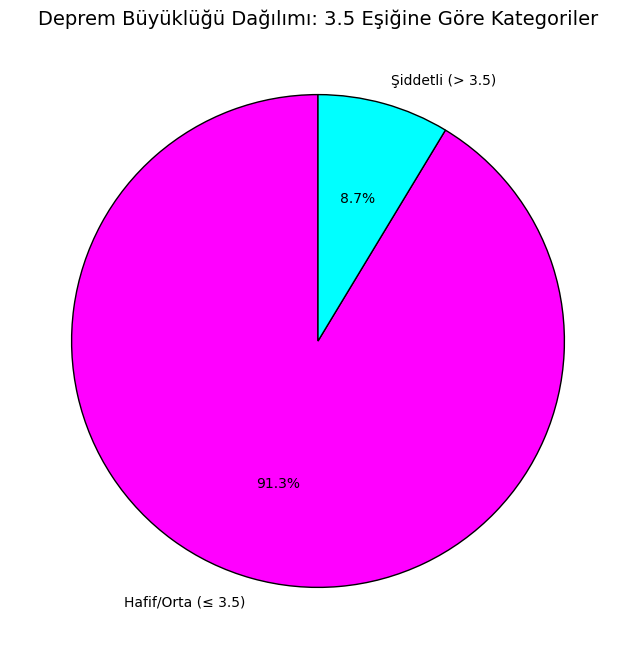

<Figure size 640x480 with 0 Axes>

In [5]:
bins = [df['Buyukluk'].min() - 0.01, 3.5, df['Buyukluk'].max() + 0.01]
labels = ['Hafif/Orta (≤ 3.5)', 'Şiddetli (> 3.5)']

df['Siddet_Kategorisi'] = pd.cut(
    df['Buyukluk'],
    bins=bins,
    labels=labels,
    right=True,
    include_lowest=True
)

frequency_table = df['Siddet_Kategorisi'].value_counts().sort_index()
frequency_df = frequency_table.to_frame(name='Frekans').reset_index()
frequency_df['Oran (%)'] = (frequency_df['Frekans'] / frequency_df['Frekans'].sum()) * 100

print("\nKategori Bazlı Frekans Tablosu")
print(frequency_df)

colors = ['#FF00FF', '#00FFFF']

plt.figure(figsize=(8, 8))
plt.pie(
    frequency_table,
    labels=frequency_table.index,
    colors=colors,
    autopct='%1.1f%%',
    startangle=90,
    wedgeprops={'edgecolor': 'black', 'linewidth': 1}
)
plt.title('Deprem Büyüklüğü Dağılımı: 3.5 Eşiğine Göre Kategoriler', fontsize=14)
plt.show()
plt.savefig('siddet_kategorisi_daire_grafiği.png')


--- Detaylı Büyüklük Aralıklarına Göre Frekans Tablosu ---
    Buyukluk  Frekans  Oran (%)
0        1.2        1  0.346021
1        1.3        1  0.346021
2        1.4        2  0.692042
3        1.5        6  2.076125
4        1.6       12  4.152249
5        1.7       14  4.844291
6        1.8       27  9.342561
7        1.9       19  6.574394
8        2.0       18  6.228374
9        2.1       22  7.612457
10       2.2       19  6.574394
11       2.3       17  5.882353
12       2.4       13  4.498270
13       2.5       11  3.806228
14       2.6       13  4.498270
15       2.7        8  2.768166
16       2.8       11  3.806228
17       2.9       10  3.460208
18       3.0        5  1.730104
19       3.1       10  3.460208
20       3.2        8  2.768166
21       3.3        8  2.768166
22       3.4        4  1.384083
23       3.5        5  1.730104
24       3.6        8  2.768166
25       3.7        3  1.038062
26       3.8        3  1.038062
27       3.9        2  0.692042
28       4.0

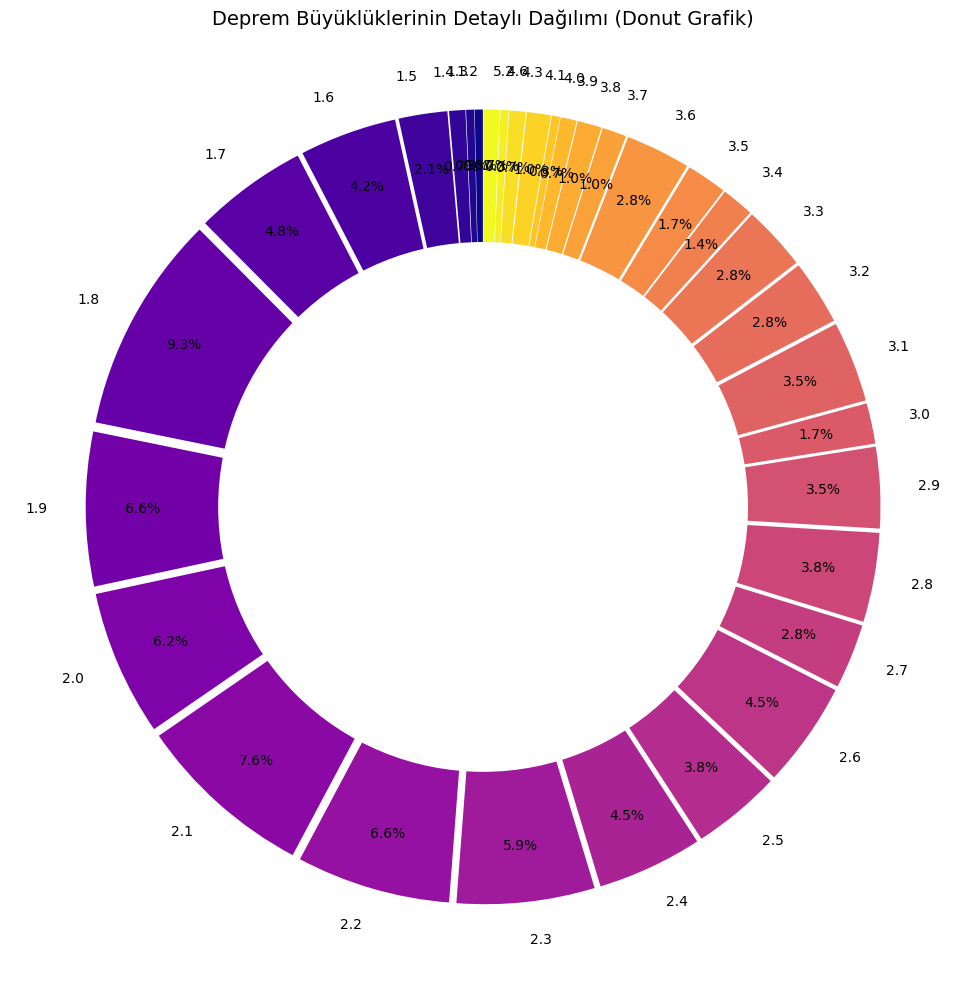

<Figure size 640x480 with 0 Axes>

In [6]:
frequency_table = df['Buyukluk'].value_counts().sort_index()
frequency_df = frequency_table.to_frame(name='Frekans').reset_index()
frequency_df['Oran (%)'] = (frequency_df['Frekans'] / frequency_df['Frekans'].sum()) * 100
print("\n--- Detaylı Büyüklük Aralıklarına Göre Frekans Tablosu ---")
print(frequency_df)
plt.figure(figsize=(10, 10))
colors = plt.cm.plasma(np.linspace(0, 1, len(frequency_table)))
explode = [0.05] * len(frequency_table)
plt.pie(
    frequency_table,
    labels=frequency_table.index,
    colors=colors,
    autopct='%1.1f%%',
    startangle=90,
    pctdistance=0.85,
    explode=explode
)
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Deprem Büyüklüklerinin Detaylı Dağılımı (Donut Grafik)', fontsize=14)
plt.tight_layout()
plt.show()
plt.savefig('detayli_buyukluk_donut_grafiği.png')

<Axes: >

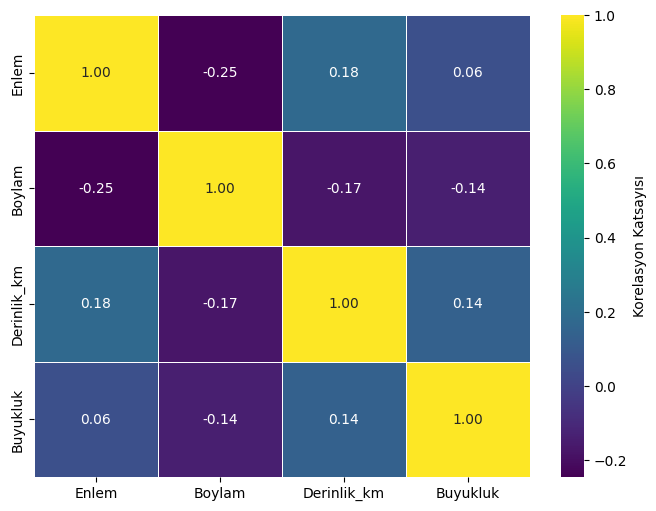

In [7]:
numerical_cols = ['Enlem', 'Boylam', 'Derinlik_km', 'Buyukluk']
correlation_matrix = df[numerical_cols].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(
    correlation_matrix,
    annot=True,
    fmt=".2f",
    cmap='viridis',
    linewidths=.5,
    cbar_kws={'label': 'Korelasyon Katsayısı'}
)

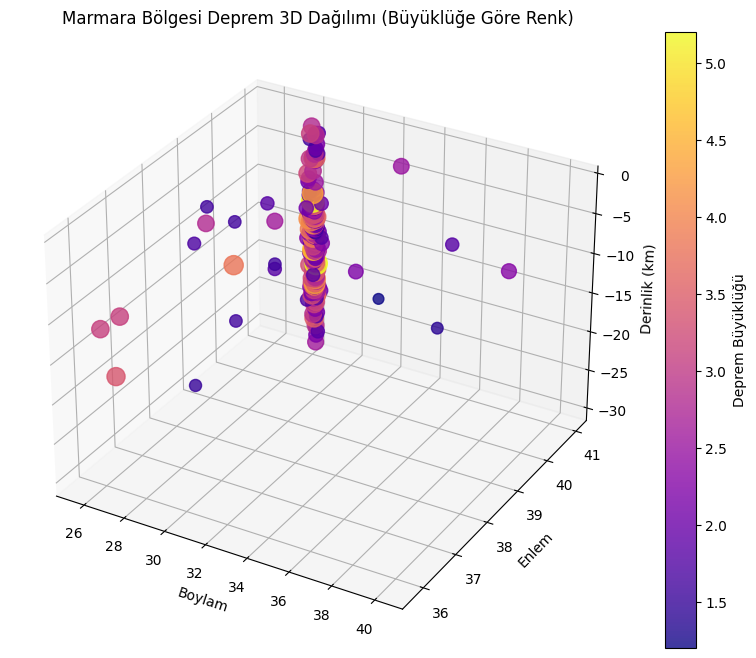

In [8]:
import geopandas as gpd
from shapely.geometry import Point
df_3d = df[['Enlem', 'Boylam', 'Derinlik_km', 'Buyukluk']].copy()
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(
    df_3d['Boylam'],
    df_3d['Enlem'],  
    df_3d['Derinlik_km'] * -1, 
    c=df_3d['Buyukluk'],
    cmap='plasma', 
    s=df_3d['Buyukluk'] * 50, 
    alpha=0.8
)

ax.set_xlabel('Boylam')
ax.set_ylabel('Enlem')
ax.set_zlabel('Derinlik (km)')
ax.set_title('Marmara Bölgesi Deprem 3D Dağılımı (Büyüklüğe Göre Renk)')
fig.colorbar(sc, label='Deprem Büyüklüğü')

Text(117.09722222222221, 0.5, 'Enlem')

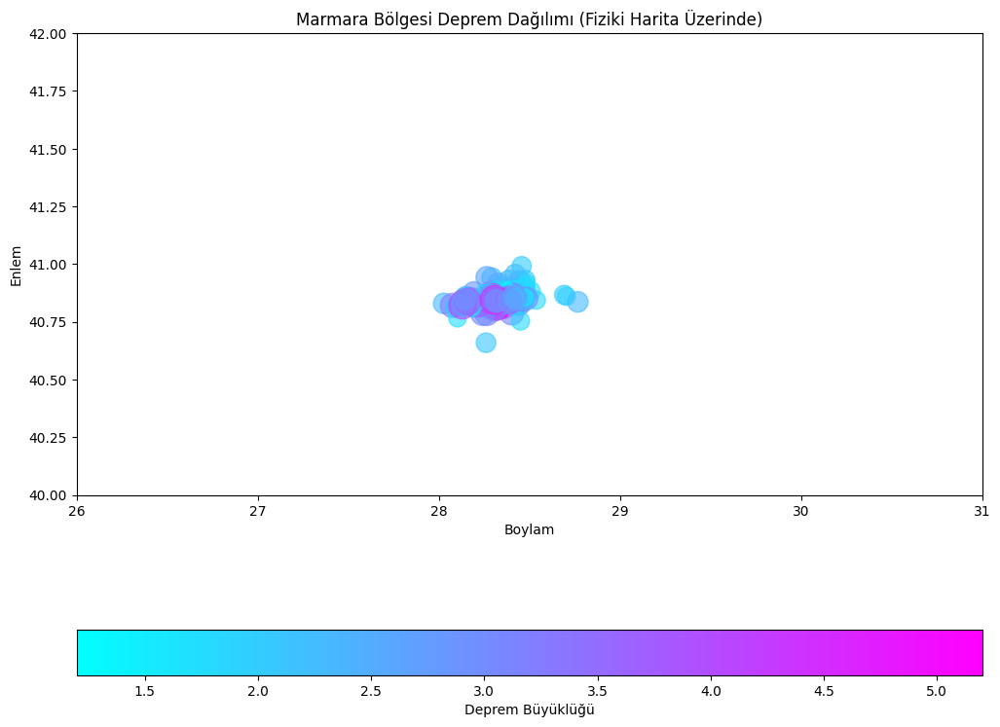

In [9]:
import geopandas as gpd
from shapely.geometry import Point
geometry = [Point(xy) for xy in zip(df['Boylam'], df['Enlem'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")
fig, ax = plt.subplots(1, 1, figsize=(12, 12))
gdf.plot(
    ax=ax,
    marker='o',
    column='Buyukluk',
    cmap='cool',
    markersize=gdf['Buyukluk'] * 100,
    alpha=0.6,
    legend=True,
    legend_kwds={'label': "Deprem Büyüklüğü", 'orientation': "horizontal"}
)
ax.set_xlim(26, 31)
ax.set_ylim(40, 42)
ax.set_title('Marmara Bölgesi Deprem Dağılımı (Fiziki Harita Üzerinde)')
ax.set_xlabel('Boylam')
ax.set_ylabel('Enlem')

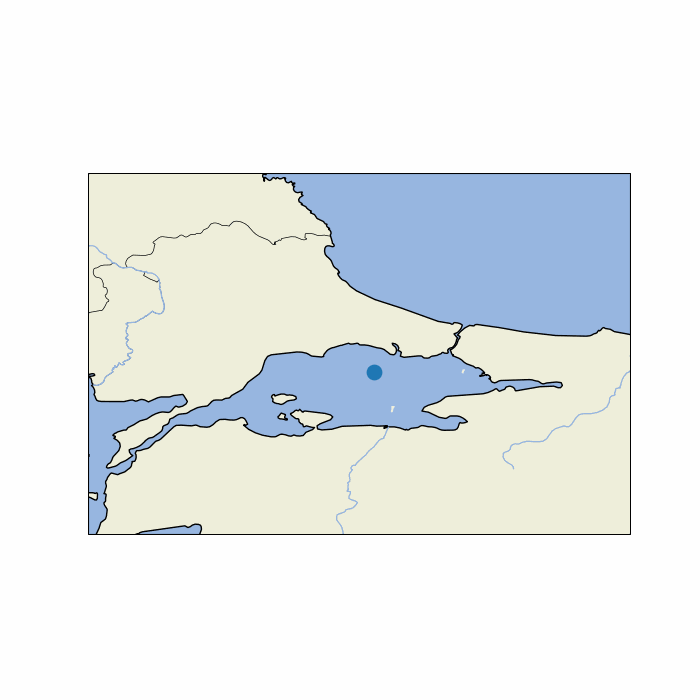

In [10]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import imageio
from IPython.display import Image, display
marmara = df[(df['Enlem']>=39.5) & (df['Enlem']<=42.5) &
             (df['Boylam']>=26) & (df['Boylam']<=30.5)].reset_index(drop=True)

frames = []
for i in range(len(marmara)):
    fig = plt.figure(figsize=(7,7))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([26, 30.5, 39.5, 42.5], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.RIVERS)

    ax.scatter(marmara['Boylam'][:i+1], marmara['Enlem'][:i+1],
               s=marmara['Buyukluk'][:i+1]*25, transform=ccrs.PlateCarree())

    filename = f'/kaggle/working/frame_phys_{i}.png'
    plt.savefig(filename, dpi=100)
    plt.close()
    frames.append(imageio.imread(filename))
imageio.mimsave(
    '/kaggle/working/marmara_depremleri_animasyon.gif', 
    frames,                                          
    fps=5                                             
)
display(Image(filename='/kaggle/working/marmara_depremleri_animasyon.gif'))

 Renklendirme için 'Buyukluk' kullanılacaktır.


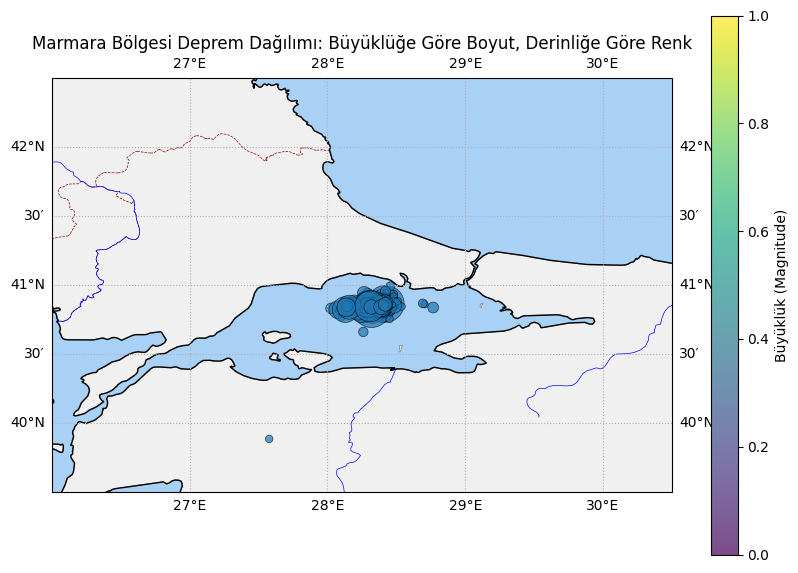

In [11]:
if 'Derinlik' not in marmara.columns:
    print(" Renklendirme için 'Buyukluk' kullanılacaktır.")
    marmara['Renk_Kolonu'] = marmara['Buyukluk']
    cbar_label = 'Büyüklük (Magnitude)'
else:
    marmara['Renk_Kolonu'] = marmara['Derinlik']
    cbar_label = 'Derinlik (km)'
plt.figure(figsize=(10, 10))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([26, 30.5, 39.5, 42.5], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND, edgecolor='gray', facecolor='#F0F0F0') 
ax.add_feature(cfeature.OCEAN, facecolor='#A9D0F5') 
ax.add_feature(cfeature.COASTLINE, linewidth=1, edgecolor='black')
ax.add_feature(cfeature.BORDERS, linestyle='--', linewidth=0.5, edgecolor='darkred')
ax.add_feature(cfeature.RIVERS, edgecolor='blue', linewidth=0.5)
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle=':')
scatter = ax.scatter(
    marmara['Boylam'], 
    marmara['Enlem'],
    s=marmara['Buyukluk']**3 * 5, 
   # c=marmara['Renk_Kolonu'],    
    cmap='viridis_r',           
    alpha=0.7, 
    edgecolor='black',
    linewidth=0.5,
    transform=ccrs.PlateCarree()
)

cbar = plt.colorbar(scatter, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label(cbar_label)
plt.title('Marmara Bölgesi Deprem Dağılımı: Büyüklüğe Göre Boyut, Derinliğe Göre Renk', fontsize=12)
plt.show()

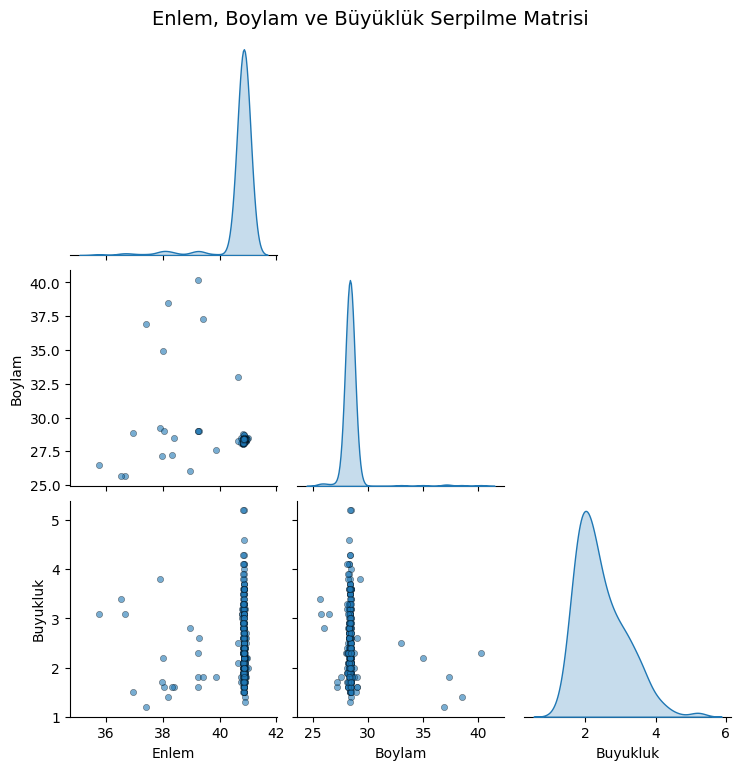

In [12]:
data_for_matrix = df[['Enlem', 'Boylam', 'Buyukluk']]
sns.pairplot(
    data_for_matrix, 
    diag_kind='kde',
    plot_kws={'alpha': 0.6, 's': 20, 'edgecolor': 'k'}, 
    corner=True 
)

plt.suptitle('Enlem, Boylam ve Büyüklük Serpilme Matrisi', y=1.02, fontsize=14)
plt.show()

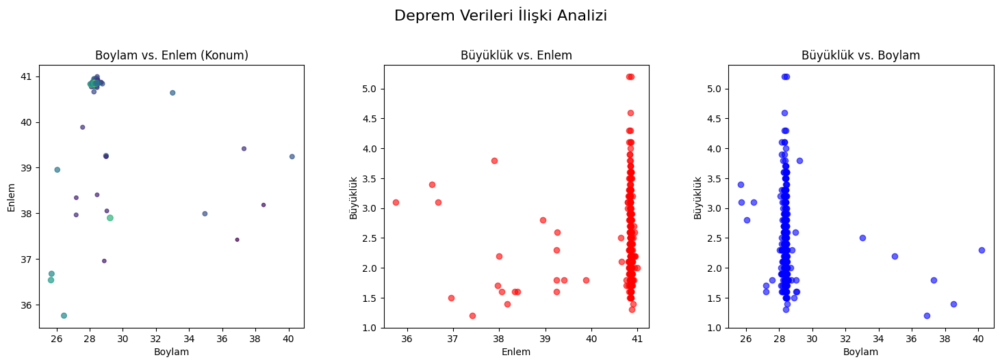

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5)) 
plt.subplots_adjust(wspace=0.3) 
axes[0].scatter(df['Boylam'], df['Enlem'], 
                s=df['Buyukluk'] * 10, 
                c=df['Buyukluk'],     
                cmap='viridis',
                alpha=0.7)
axes[0].set_title('Boylam vs. Enlem (Konum)')
axes[0].set_xlabel('Boylam')
axes[0].set_ylabel('Enlem')
axes[1].scatter(df['Enlem'], df['Buyukluk'], color='red', alpha=0.6)
axes[1].set_title('Büyüklük vs. Enlem')
axes[1].set_xlabel('Enlem')
axes[1].set_ylabel('Büyüklük')
axes[2].scatter(df['Boylam'], df['Buyukluk'], color='blue', alpha=0.6)
axes[2].set_title('Büyüklük vs. Boylam')
axes[2].set_xlabel('Boylam')
axes[2].set_ylabel('Büyüklük')

plt.suptitle('Deprem Verileri İlişki Analizi', fontsize=16, y=1.05)
plt.show()

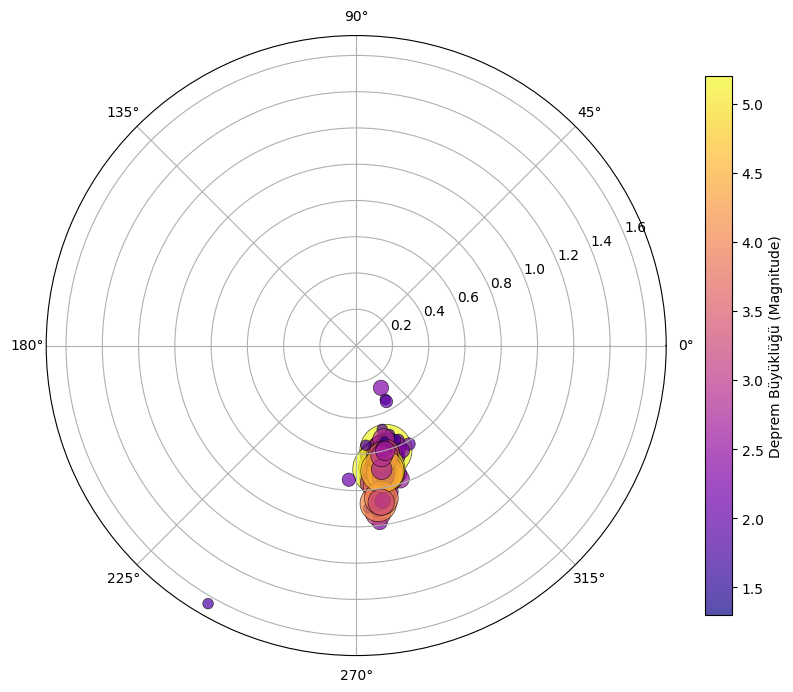

In [14]:
CENTER_LAT = 40.7
CENTER_LON = 29.0
marmara = df[(df['Enlem']>=39.5) & (df['Enlem']<=42.5) &
             (df['Boylam']>=26) & (df['Boylam']<=30.5)].copy()
marmara['Theta'] = np.arctan2(marmara['Boylam'] - CENTER_LON, marmara['Enlem'] - CENTER_LAT)
marmara['Radius'] = np.sqrt((marmara['Enlem'] - CENTER_LAT)**2 + (marmara['Boylam'] - CENTER_LON)**2)
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='polar')
scatter = ax.scatter(
    marmara['Theta'],       
    marmara['Radius'],      
    s=marmara['Buyukluk']**3 * 10,  
    c=marmara['Buyukluk'],        
    cmap='plasma',                 
    alpha=0.7,
    edgecolors='black',
    linewidths=0.5
)

cbar = fig.colorbar(scatter, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Deprem Büyüklüğü (Magnitude)')

error: XDG_RUNTIME_DIR not set in the environment.
ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1334:(snd_func_refer) error evaluating name
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5701:(snd_config_expand) Evaluate error: No such file or directory
ALSA lib pcm.c:2664:(snd_pcm_open_noupdate) Unknown PCM default
ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5178:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5178:(_snd_config_evalu

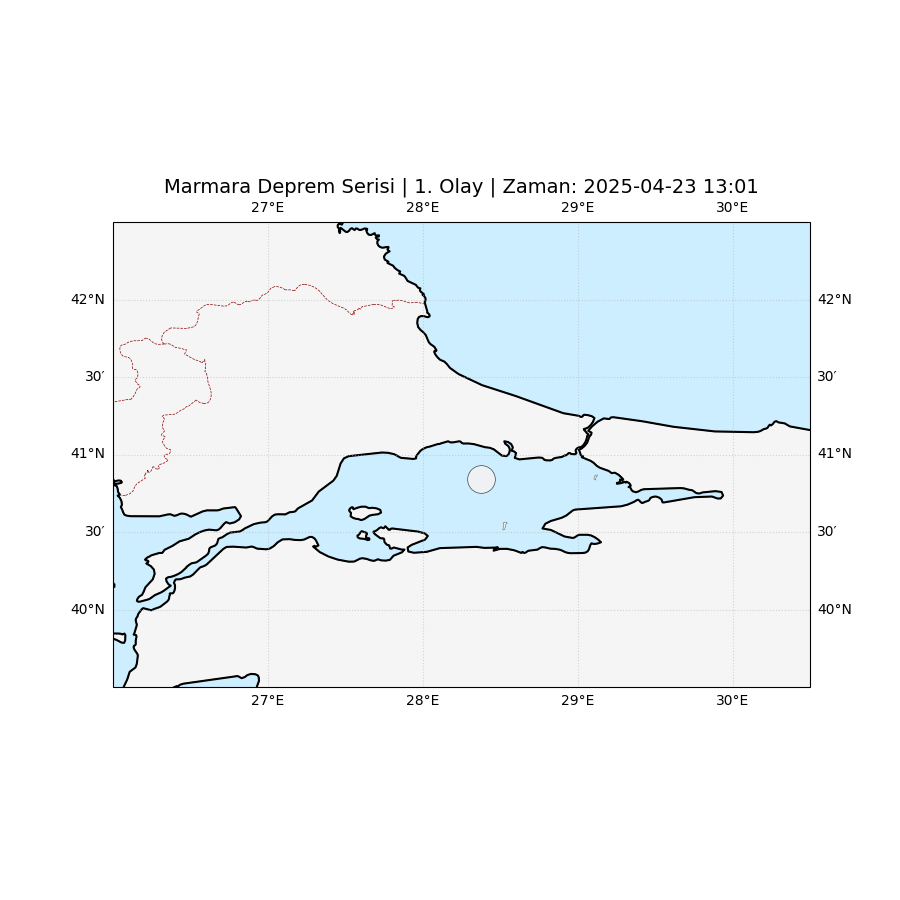

In [15]:
import cartopy.feature as cfeature
import os
import shutil
from moviepy.editor import ImageSequenceClip
from IPython.display import Image, display

df["Gun"] = df["Olus_Zamani"].dt.day
df_sorted = df.sort_values(by="Olus_Zamani").reset_index(drop=True)

marmara = df_sorted[(df_sorted['Enlem']>=39.5) & (df_sorted['Enlem']<=42.5) &
                    (df_sorted['Boylam']>=26) & (df_sorted['Boylam']<=30.5)].reset_index(drop=True)

temp_dir = 'temp_marmara_animation'
if os.path.exists(temp_dir):
    shutil.rmtree(temp_dir)
os.makedirs(temp_dir)

temp_filenames = []
for i in range(len(marmara)):
    subset = marmara.iloc[:i+1]
    
    fig = plt.figure(figsize=(9, 9))
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([26, 30.5, 39.5, 42.5], crs=ccrs.PlateCarree())
    
    ax.add_feature(cfeature.LAND, edgecolor='gray', facecolor='#f5f5f5') 
    ax.add_feature(cfeature.OCEAN, facecolor='#cceeff')
    ax.add_feature(cfeature.COASTLINE, linewidth=1.5)
    ax.add_feature(cfeature.BORDERS, linestyle='--', linewidth=0.5, edgecolor='darkred')
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle=':', alpha=0.5)

    scatter = ax.scatter(
        subset['Boylam'], subset['Enlem'],
        s=subset['Buyukluk']**3 * 5,  
        c=subset['Buyukluk'],
        cmap='Reds', 
        alpha=0.7,
        edgecolor='black',
        linewidth=0.5,
        transform=ccrs.PlateCarree()
    )
    
    current_time = subset['Olus_Zamani'].iloc[-1].strftime('%Y-%m-%d %H:%M')
    plt.title(f"Marmara Deprem Serisi | {i+1}. Olay | Zaman: {current_time}", fontsize=14)
    
    filename = os.path.join(temp_dir, f'frame_{i:04d}.png') 
    plt.savefig(filename, dpi=100) 
    plt.close()
    temp_filenames.append(filename)

output_gif = 'marmara_depremleri_python_animasyon.gif'
clip = ImageSequenceClip(temp_filenames, fps=5) 
clip.write_gif(output_gif, verbose=False, logger=None)

shutil.rmtree(temp_dir) 
display(Image(filename=output_gif))